# Language with Statistics

In [1]:
import nltk
nltk.download("book")
from nltk.book import *
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

[nltk_data] Downloading collection 'book'
[nltk_data]    | 
[nltk_data]    | Downloading package abc to
[nltk_data]    |     /home/sjvasconcello/nltk_data...
[nltk_data]    |   Package abc is already up-to-date!
[nltk_data]    | Downloading package brown to
[nltk_data]    |     /home/sjvasconcello/nltk_data...
[nltk_data]    |   Package brown is already up-to-date!
[nltk_data]    | Downloading package chat80 to
[nltk_data]    |     /home/sjvasconcello/nltk_data...
[nltk_data]    |   Package chat80 is already up-to-date!
[nltk_data]    | Downloading package cmudict to
[nltk_data]    |     /home/sjvasconcello/nltk_data...
[nltk_data]    |   Package cmudict is already up-to-date!
[nltk_data]    | Downloading package conll2000 to
[nltk_data]    |     /home/sjvasconcello/nltk_data...
[nltk_data]    |   Package conll2000 is already up-to-date!
[nltk_data]    | Downloading package conll2002 to
[nltk_data]    |     /home/sjvasconcello/nltk_data...
[nltk_data]    |   Package conll2002 is alread

*** Introductory Examples for the NLTK Book ***
Loading text1, ..., text9 and sent1, ..., sent9
Type the name of the text or sentence to view it.
Type: 'texts()' or 'sents()' to list the materials.
text1: Moby Dick by Herman Melville 1851
text2: Sense and Sensibility by Jane Austen 1811
text3: The Book of Genesis
text4: Inaugural Address Corpus
text5: Chat Corpus
text6: Monty Python and the Holy Grail
text7: Wall Street Journal
text8: Personals Corpus
text9: The Man Who Was Thursday by G . K . Chesterton 1908


In [2]:
import plotly.express as px

## Bi-gramas
Parejas de palabras que ocurren consecutivas

In [3]:
md_bigrams = list(bigrams(text1))
fdist = FreqDist(md_bigrams)

In [4]:
fdist.most_common(10)

[((',', 'and'), 2607),
 (('of', 'the'), 1847),
 (("'", 's'), 1737),
 (('in', 'the'), 1120),
 ((',', 'the'), 908),
 ((';', 'and'), 853),
 (('to', 'the'), 712),
 (('.', 'But'), 596),
 ((',', 'that'), 584),
 (('.', '"'), 557)]

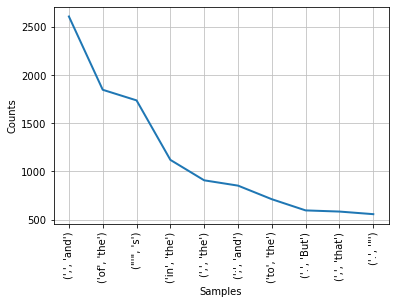

In [5]:
fdist.plot(10)

Filtrado de Bigrams

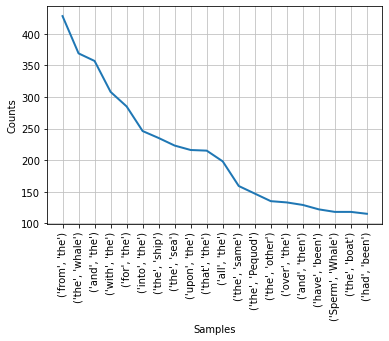

In [6]:
threshold = 2
filtered_bigrams = [bigram for bigram in md_bigrams \
                    if ((len(bigram[0]) > threshold) and (len(bigram[1]) > threshold))]
filtered_dist = FreqDist(filtered_bigrams)
filtered_dist.plot(20)

### Tri-grams

In [7]:
from nltk.util import ngrams
md_trigrams = list(ngrams(text1,3))
fdist = FreqDist(md_trigrams)
fdist.most_common(10)

[((',', 'and', 'the'), 187),
 (('don', "'", 't'), 103),
 (('of', 'the', 'whale'), 101),
 ((',', 'in', 'the'), 93),
 ((',', 'then', ','), 87),
 (('whale', "'", 's'), 81),
 (('.', 'It', 'was'), 81),
 (('ship', "'", 's'), 80),
 (('the', 'Sperm', 'Whale'), 77),
 ((',', 'as', 'if'), 76)]

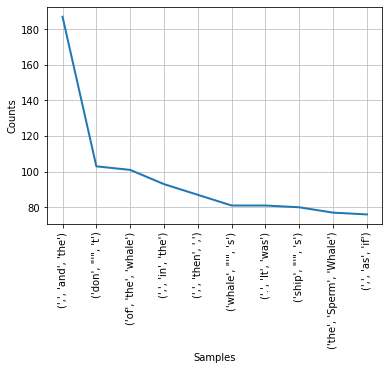

In [8]:
fdist.plot(10)

## Collocations (Colocaciones)
- Son secuencias de palabras que suelen ocurrir en textos o conversaciones con una **frecuencia inusualmente alta**
- Las colocaciones de una palabra son declaraciones formales de donde suele ubicaese tipicamente esa palabra

In [9]:
md_bigrams = list(bigrams(text1))

threshold = 2
filtered_bigrams = [bigram for bigram in md_bigrams if len(bigram[0]) > threshold and len(bigram[1]) > threshold]
filtered_bigram_dist = FreqDist(filtered_bigrams)

In [10]:
filtered_words = [word for word in text1 if len(word) > threshold]
filtered_words_dist = FreqDist(filtered_words)

In [11]:
df = pd.DataFrame()
df["bi_grams"] = list(set(filtered_bigrams))
df.head()

,bi_grams
0,"(and, gloss)"
1,"(forget, all)"
2,"(the, hempen)"
3,"(heaving, swells)"
4,"(these, tawny)"


In [12]:
df["word_0"] = df["bi_grams"].apply(lambda x: x[0])
df["word_1"] = df["bi_grams"].apply(lambda x: x[1])
df.head()

,bi_grams,word_0,word_1
0,"(and, gloss)",and,gloss
1,"(forget, all)",forget,all
2,"(the, hempen)",the,hempen
3,"(heaving, swells)",heaving,swells
4,"(these, tawny)",these,tawny


In [13]:
df["bigrams_freq"] = df["bi_grams"].apply(lambda x: filtered_bigram_dist[x])
df["word_0_freq"] = df["word_0"].apply(lambda x: filtered_words_dist[x])
df["word_1_freq"] = df["word_1"].apply(lambda x: filtered_words_dist[x])

In [14]:
df

,bi_grams,word_0,word_1,bigrams_freq,word_0_freq,word_1_freq
0,"(and, gloss)",and,gloss,1,6024,1
1,"(forget, all)",forget,all,1,11,1462
2,"(the, hempen)",the,hempen,3,13721,7
3,"(heaving, swells)",heaving,swells,1,15,11
4,"(these, tawny)",these,tawny,1,381,4
...,...,...,...,...,...,...
67937,"(eyes, shut)",eyes,shut,1,155,11
67938,"(animal, with)",animal,with,1,16,1659
67939,"(!--, come)",!--,come,1,141,150
67940,"(your, contemplative)",your,contemplative,1,240,2


### Pointwise Mutual Information (PMI)
$$
PMI = log(\frac{P(w_1,w_2)}{P(w_1)P(w_2)})
$$

In [15]:
df["PMI"] = df[["bigrams_freq","word_0_freq","word_1_freq"]].apply(lambda x: np.log2(x.values[0]/(x.values[1]*x.values[2])), axis=1)
df["log(bigrams_freq)"] = df["bigrams_freq"].apply(lambda x: np.log2(x))
df

,bi_grams,word_0,word_1,bigrams_freq,word_0_freq,word_1_freq,PMI,log(bigrams_freq)
0,"(and, gloss)",and,gloss,1,6024,1,-12.556506,0.000000
1,"(forget, all)",forget,all,1,11,1462,-13.973159,0.000000
2,"(the, hempen)",the,hempen,3,13721,7,-14.966490,1.584963
3,"(heaving, swells)",heaving,swells,1,15,11,-7.366322,0.000000
4,"(these, tawny)",these,tawny,1,381,4,-10.573647,0.000000
...,...,...,...,...,...,...,...,...
67937,"(eyes, shut)",eyes,shut,1,155,11,-10.735556,0.000000
67938,"(animal, with)",animal,with,1,16,1659,-14.696098,0.000000
67939,"(!--, come)",!--,come,1,141,150,-14.368370,0.000000
67940,"(your, contemplative)",your,contemplative,1,240,2,-8.906891,0.000000


In [16]:
df.sort_values(by ="PMI", ascending= False)

,bi_grams,word_0,word_1,bigrams_freq,word_0_freq,word_1_freq,PMI,log(bigrams_freq)
66041,"(Parisians, entrenched)",Parisians,entrenched,1,1,1,0.000000,0.0
46490,"(Australian, settlement)",Australian,settlement,1,1,1,0.000000,0.0
20489,"(unicorns, infesting)",unicorns,infesting,1,1,1,0.000000,0.0
45373,"(HUSSEY, SURVIVORS)",HUSSEY,SURVIVORS,1,1,1,0.000000,0.0
39614,"(scrabble, scramble)",scrabble,scramble,1,1,1,0.000000,0.0
...,...,...,...,...,...,...,...,...
56851,"(man, the)",man,the,1,508,13721,-22.732783,0.0
58402,"(some, the)",some,the,1,578,13721,-22.919024,0.0
39425,"(one, the)",one,the,1,889,13721,-23.540138,0.0
15470,"(the, not)",the,not,1,13721,1103,-23.851315,0.0


In [18]:
fig = px.scatter(x = df["PMI"].values, 
                 y = df["log(bigrams_freq)"], 
                 color = df["log(bigrams_freq)"]+df["PMI"], 
                 hover_name = df["bi_grams"], 
                 width = 600, 
                 height = 600,  
                 labels = { "x": "PMI", "y": "Log(Biframs frequency)"} )
fig.show()

### Medidas pre-contstruidas en NLTK

In [20]:
from nltk.collocations import *
bigram_measure = nltk.collocations.BigramAssocMeasures()
finder = BigramCollocationFinder.from_words(text1)

In [22]:
finder.apply_freq_filter(20)
finder.nbest(bigram_measure.pmi, 10)

[('Moby', 'Dick'),
 ('Sperm', 'Whale'),
 ('White', 'Whale'),
 ('Right', 'Whale'),
 ('Captain', 'Peleg'),
 (',"', 'said'),
 ('never', 'mind'),
 ('!"', 'cried'),
 ('no', 'means'),
 ('each', 'other')]

In [23]:
nltk.download("cess_esp")
corpus = nltk.corpus.cess_esp.sents()
corpus

[nltk_data] Downloading package cess_esp to
[nltk_data]     /home/sjvasconcello/nltk_data...
[nltk_data]   Package cess_esp is already up-to-date!


[['El', 'grupo', 'estatal', 'Electricité_de_France', '-Fpa-', 'EDF', '-Fpt-', 'anunció', 'hoy', ',', 'jueves', ',', 'la', 'compra', 'del', '51_por_ciento', 'de', 'la', 'empresa', 'mexicana', 'Electricidad_Águila_de_Altamira', '-Fpa-', 'EAA', '-Fpt-', ',', 'creada', 'por', 'el', 'japonés', 'Mitsubishi_Corporation', 'para', 'poner_en_marcha', 'una', 'central', 'de', 'gas', 'de', '495', 'megavatios', '.'], ['Una', 'portavoz', 'de', 'EDF', 'explicó', 'a', 'EFE', 'que', 'el', 'proyecto', 'para', 'la', 'construcción', 'de', 'Altamira_2', ',', 'al', 'norte', 'de', 'Tampico', ',', 'prevé', 'la', 'utilización', 'de', 'gas', 'natural', 'como', 'combustible', 'principal', 'en', 'una', 'central', 'de', 'ciclo', 'combinado', 'que', 'debe', 'empezar', 'a', 'funcionar', 'en', 'mayo_del_2002', '.'], ...]

In [26]:
flatten_corpus = [w for l in corpus for w in l]
print(flatten_corpus[:30])

['El', 'grupo', 'estatal', 'Electricité_de_France', '-Fpa-', 'EDF', '-Fpt-', 'anunció', 'hoy', ',', 'jueves', ',', 'la', 'compra', 'del', '51_por_ciento', 'de', 'la', 'empresa', 'mexicana', 'Electricidad_Águila_de_Altamira', '-Fpa-', 'EAA', '-Fpt-', ',', 'creada', 'por', 'el', 'japonés', 'Mitsubishi_Corporation']


In [28]:
finder = BigramCollocationFinder.from_documents(corpus)
finder.apply_freq_filter(10)
finder.nbest(bigram_measure.pmi, 10)

[('señora', 'Aguirre'),
 ('secretario', 'general'),
 ('elecciones', 'generales'),
 ('campaña', 'electoral'),
 ('quiere', 'decir'),
 ('Se', 'trata'),
 ('segunda', 'vuelta'),
 ('director', 'general'),
 ('primer', 'ministro'),
 ('primer', 'lugar')]